**Importando as bibliotecas**

In [ ]:
# instalando a biblioteca
!pip install pycaret

In [ ]:
!pip install sktime

In [ ]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels as sm
from pprint import pprint
from sktime.utils.plotting import plot_series

In [ ]:
!pip install jinja2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pycaret.time_series import TSForecastingExperiment

**Importando os Datasets**

Serão utilizados 02 produtos

In [ ]:
df = pd.read_excel('/content/600500042010557.xlsx', index_col='data')
df.index = pd.date_range('2018-01-01', periods=52, freq='M')
df2 = pd.read_excel('/content/606000068008567.xlsx', index_col='Data')
df2.index = pd.date_range('2018-01-01', periods=52, freq='M')

**Breve análise de dados**

In [ ]:
df.shape

(52, 1)

In [ ]:
df.head()

,Qtde
2018-01-31,600
2018-02-28,1392
2018-03-31,2670
2018-04-30,584
2018-05-31,1158


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52 entries, 2018-01-01 to 2022-04-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Qtde    52 non-null     int64
dtypes: int64(1)
memory usage: 832.0 bytes


In [ ]:
df.describe()

,Qtde
count,52.000000
mean,2011.923077
std,1637.110640
min,200.000000
25%,709.500000
50%,1560.000000
75%,2891.250000
max,7314.000000


In [ ]:
df2.describe()

,Qtde
count,52.000000
mean,2015.000000
std,4087.360004
min,359.000000
25%,806.250000
50%,1217.000000
75%,1515.000000
max,23282.000000


Série temporal - Produto 1

<AxesSubplot:>

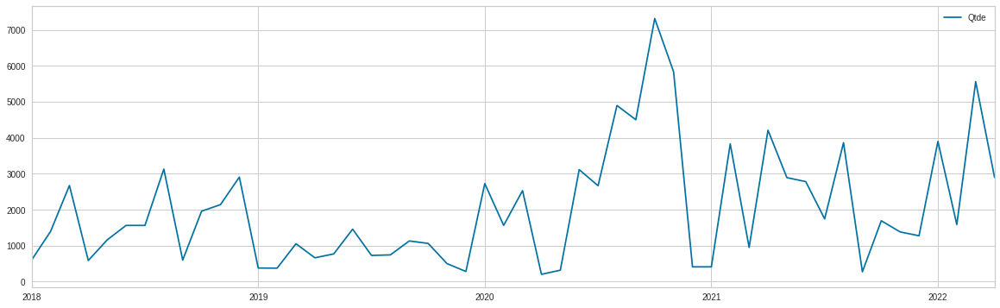

In [ ]:
df.plot(figsize=(20,6))

Série temporal - Produto 2

<AxesSubplot:>

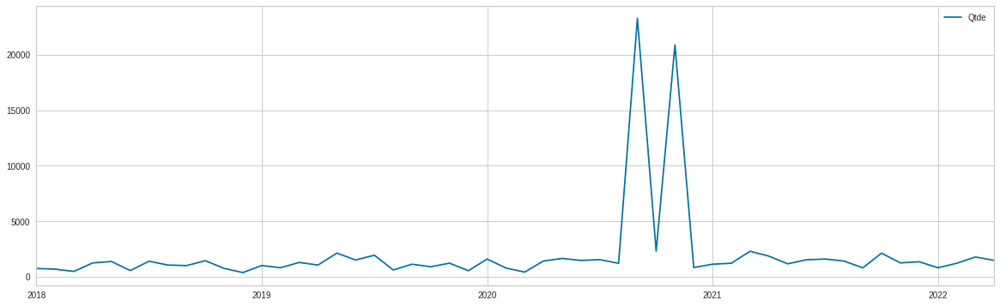

In [ ]:
df2.plot(figsize=(20,6))

**Tratamento de outliers**

Produto 1

In [ ]:
print(df.sort_values('qtde', ascending=False).head(5))
print(df.sort_values('qtde', ascending=True).head(5))

            qtde
2020-10-31  7314
2020-11-30  5832
2022-03-31  5559
2020-08-31  4895
2020-09-30  4500
            qtde
2020-04-30   200
2021-09-30   270
2019-12-31   279
2020-05-31   315
2019-02-28   372


In [ ]:
media_qtde = df['qtde'].mean()
media_qtde

2011.923076923077

In [ ]:
df.loc[df['qtde'] > 5000, 'qtde'] = media_qtde
df.loc[df['qtde'] < 400, 'qtde'] = media_qtde

In [ ]:
df.describe()

,qtde
count,52.000000
mean,1965.602071
std,1117.767050
min,408.000000
25%,1111.000000
50%,1983.961538
75%,2683.500000
max,4895.000000


<AxesSubplot:>

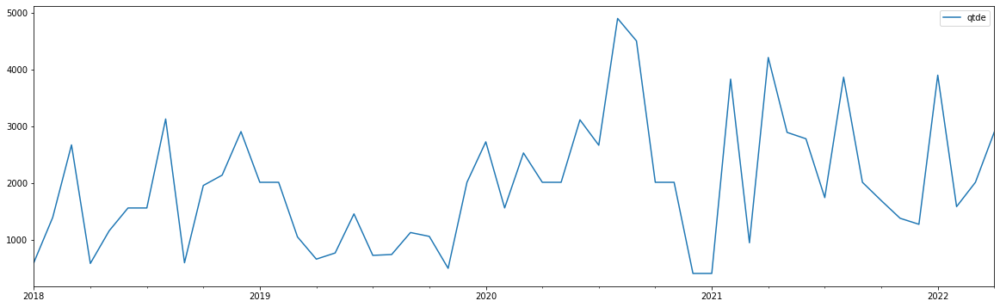

In [ ]:
df.plot(figsize=(20,6))

Produto 2

In [ ]:
print(df2.sort_values('Qtde', ascending=False).head(5)['Qtde'])
print(df2.sort_values('Qtde', ascending=True).head(5)['Qtde'])

2020-09-30    23282
2020-11-30    20888
2020-10-31     2286
2021-03-31     2280
2019-05-31     2113
Name: Qtde, dtype: int64
2018-12-31    359
2020-03-31    402
2018-03-31    462
2019-12-31    522
2018-06-30    541
Name: Qtde, dtype: int64


In [ ]:
media_qtde2 = df2['Qtde'].mean()
media_qtde2

2015.0

In [ ]:
df2.loc[df2['Qtde'] > 2400, 'Qtde'] = media_qtde2
df2.loc[df2['Qtde'] < 600, 'Qtde'] = media_qtde2

In [ ]:
print(df2.sort_values('Qtde', ascending=False).head(5)['Qtde'])

2020-10-31    2286
2021-03-31    2280
2019-05-31    2113
2021-10-31    2108
2020-03-31    2015
Name: Qtde, dtype: int64


In [ ]:
df2.describe()

,Qtde
count,52.000000
mean,1420.192308
std,464.048723
min,662.000000
25%,1091.250000
50%,1389.500000
75%,1861.500000
max,2286.000000


<AxesSubplot:>

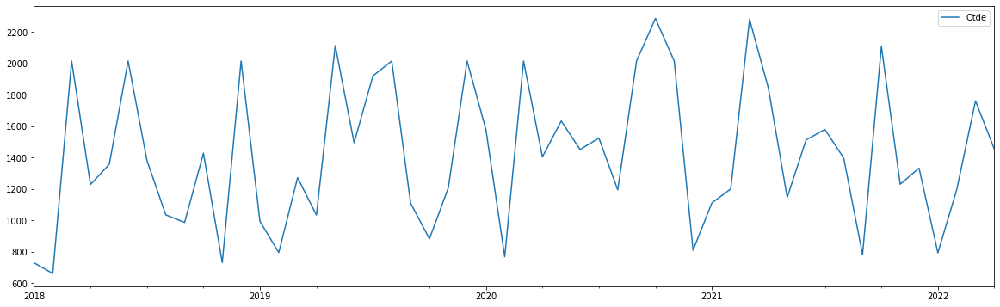

In [ ]:
df2.plot(figsize=(20,6))

Vamos decompor a série para avaliar tendência

Sazonalidade e resíduo

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

resultado = seasonal_decompose(df)

<Figure size 1440x1080 with 0 Axes>

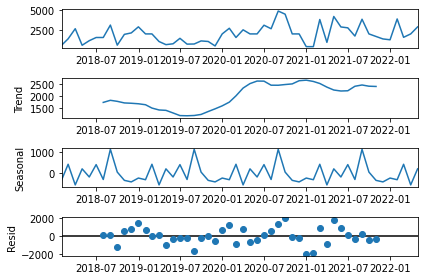

In [ ]:
fig = plt.figure(figsize=(20, 15))  
fig = resultado.plot()

<Figure size 1440x1080 with 0 Axes>

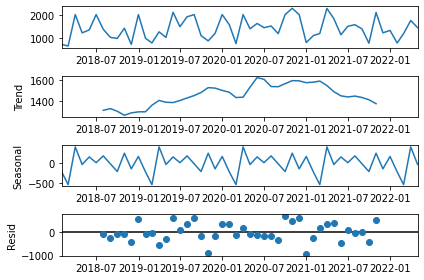

In [ ]:
resultado2 = seasonal_decompose(df2)
fig = plt.figure(figsize=(20, 15))  
fig = resultado2.plot()

**Teste de estacionariedade**

In [ ]:
from statsmodels.tsa.stattools import adfuller

result=adfuller(df['qtde'].dropna())
print(f'Teste ADF:{result[0]}')
print(f'p-valor:{result[1]}')

Teste ADF:-3.523643655998527
p-valor:0.007400236340870218


In [ ]:
result=adfuller(df2['Qtde'].dropna())
print(f'Teste ADF:{result[0]}')
print(f'p-valor:{result[1]}')

Teste ADF:-7.208904619946866
p-valor:2.2618036192558466e-10


**Prevendo com ARIMA**

Utilizar o Auto ARIMA ajuda a buscar os melhores parâmetros

In [ ]:
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
fit_arima = auto_arima(df, d=1, start_p=1, start_q=1, max_p=3, max_q=3,
                    seasonal=True, 
                           m=6, 
                           D=1, 
                           start_P=1, 
                           start_Q=1, 
                           max_P=2, 
                           max_Q=2, 
                           information_criterion='aic',
                           trace=True, 
                           error_action='ignore', 
                           stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,1,1)[6]             : AIC=inf, Time=2.07 sec
 ARIMA(0,1,0)(0,1,0)[6]             : AIC=811.662, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[6]             : AIC=792.400, Time=0.50 sec
 ARIMA(0,1,1)(0,1,1)[6]             : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,1,0)[6]             : AIC=799.376, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[6]             : AIC=791.477, Time=0.54 sec
 ARIMA(1,1,0)(2,1,1)[6]             : AIC=inf, Time=1.16 sec
 ARIMA(1,1,0)(1,1,1)[6]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(2,1,0)[6]             : AIC=804.839, Time=0.14 sec
 ARIMA(2,1,0)(2,1,0)[6]             : AIC=790.389, Time=0.62 sec
 ARIMA(2,1,0)(1,1,0)[6]             : AIC=792.899, Time=0.47 sec
 ARIMA(2,1,0)(2,1,1)[6]             : AIC=inf, Time=1.46 sec
 ARIMA(2,1,0)(1,1,1)[6]             : AIC=inf, Time=0.90 sec
 ARIMA(3,1,0)(2,1,0)[6]             : AIC=792.340, Time=0.92 sec
 ARIMA(2,1,1)(2,1,0)[6]             : AIC=inf, Time=2.30 sec
 ARIMA(1,1

In [ ]:
fit_arima2 = auto_arima(df2, d=1, start_p=1, start_q=1, max_p=3, max_q=3,
                    seasonal=True, 
                           m=6, 
                           D=1, 
                           start_P=1, 
                           start_Q=1, 
                           max_P=2, 
                           max_Q=2, 
                           information_criterion='aic',
                           trace=True, 
                           error_action='ignore', 
                           stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,1,1)[6]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[6]             : AIC=749.899, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[6]             : AIC=723.172, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[6]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[6]             : AIC=739.793, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[6]             : AIC=722.307, Time=0.84 sec
 ARIMA(1,1,0)(2,1,1)[6]             : AIC=inf, Time=1.24 sec
 ARIMA(1,1,0)(1,1,1)[6]             : AIC=718.464, Time=0.78 sec
 ARIMA(1,1,0)(0,1,1)[6]             : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(1,1,2)[6]             : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(0,1,2)[6]             : AIC=inf, Time=1.19 sec
 ARIMA(1,1,0)(2,1,2)[6]             : AIC=inf, Time=3.24 sec
 ARIMA(0,1,0)(1,1,1)[6]             : AIC=inf, Time=1.55 sec
 ARIMA(2,1,0)(1,1,1)[6]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,1)(1,1,1)[6]             : AIC=inf, Time=0.75 sec
 ARIMA(2,1,1)(1,1,1)[6

Com os melhores parametros definidos, utilizaremos o modelo SARIMAX

Versão do ARIMA com parâmetros para sazonalidade

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(df,order=(2,1,0),  seasonal_order=(2, 1, 0, 6))
resultado_sarimax = model.fit()

In [ ]:
model2 = SARIMAX(df2,order=(1,1,0),  seasonal_order=(1, 1, 1, 6))
resultado_sarimax2 = model2.fit()

Resultados do modelo SARIMAX

In [ ]:
resultado_sarimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                              qtde   No. Observations:                   52
Model:             SARIMAX(2, 1, 0)x(2, 1, 0, 6)   Log Likelihood                -390.195
Date:                           Wed, 13 Jul 2022   AIC                            790.389
Time:                                   23:40:15   BIC                            799.423
Sample:                               01-31-2018   HQIC                           793.757
                                    - 04-30-2022                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6894      0.146     -4.717      0.000      -0.976      -0.403
ar.L2         -0.2836      0.154     -1.838      0.066      -0.586       0.019
ar.S.L6       -0.6578      0.163     -4.039      0.000      -0.977      -0.339
ar.S.L12      -0.3944      0.245     -1.609      0.108      -0.875       0.086
sigma2      1.933e+06   5.02e+05      3.853      0.000     9.5e+05    2.92e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.47
Prob(Q):                              1.00   Prob(JB):                         0.79
Heteroskedasticity (H):               2.73   Skew:                             0.25
Prob(H) (two-sided):                  0.06   Kurtosis:                         3.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
resultado_sarimax2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                Qtde   No. Observations:                   52
Model:             SARIMAX(1, 1, 0)x(1, 1, [1], 6)   Log Likelihood                -355.232
Date:                             Wed, 13 Jul 2022   AIC                            718.464
Time:                                     23:40:27   BIC                            725.691
Sample:                                 01-31-2018   HQIC                           721.158
                                      - 04-30-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4210      0.172     -2.445      0.014      -0.758      -0.084
ar.S.L6       -0.1159      0.322     -0.359      0.719      -0.748       0.516
ma.S.L6       -0.8538      0.610     -1.400      0.162      -2.049       0.342
sigma2      3.707e+05   1.46e+05      2.546      0.011    8.53e+04    6.56e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                 1.57
Prob(Q):                              0.42   Prob(JB):                         0.46
Heteroskedasticity (H):               0.83   Skew:                            -0.45
Prob(H) (two-sided):                  0.73   Kurtosis:                         3.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Teste de modelo utilizando os 12 meses anteriores

In [ ]:
predicoes = resultado_sarimax.get_prediction(start=-12)
predicao_media = predicoes.predicted_mean

In [ ]:
predicoes2 = resultado_sarimax2.get_prediction(start=-12)
predicao_media2 = predicoes2.predicted_mean

Intervalo de confiança

In [ ]:
intervalo_confianca = predicoes.conf_int()
limites_abaixo = intervalo_confianca.iloc[:,0]
limites_acima = intervalo_confianca.iloc[:,1]

limites_abaixo[0], limites_acima[0]

(-791.4086000757488, 4658.757971190836)

In [ ]:
intervalo_confianca2 = predicoes2.conf_int()
limites_abaixo2 = intervalo_confianca2.iloc[:,0]
limites_acima2 = intervalo_confianca2.iloc[:,1]

limites_abaixo2[0], limites_acima2[0]

(888.0182490595837, 3329.9566512796237)

In [ ]:
predicao_media[0]

1933.6746855575434

In [ ]:
predicao_media2[0]

2108.9874501696036

In [ ]:
datas_previsao = np.asarray(predicao_media.index)
datas = np.asarray(df.index)

In [ ]:
datas_previsao2 = np.asarray(predicao_media2.index)
datas2 = np.asarray(df.index)

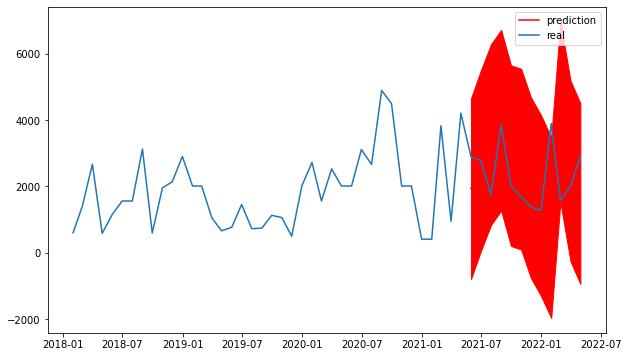

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(datas_previsao,predicao_media.values,color='red',label='prediction')
plt.fill_between(datas_previsao, limites_abaixo, limites_acima, color='red')
plt.plot(datas, df.values, label='real')
plt.legend()
plt.show()

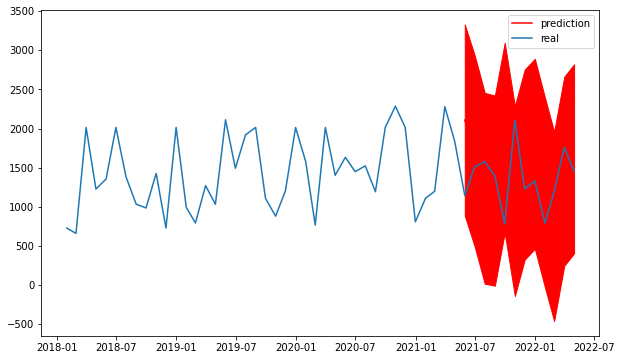

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(datas_previsao2,predicao_media2.values,color='red',label='prediction')
plt.fill_between(datas_previsao2, limites_abaixo2, limites_acima2, color='red')
plt.plot(datas2, df2.values, label='real')
plt.legend()
plt.show()

Métricas de avaliação

Produto 1

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse_sarima = sqrt(mean_squared_error(df[-12:].values,predicao_media.values))
print(rmse_sarima)

1447.3153013782207


In [ ]:
MAPE = np.mean(np.abs((df[-12:].values - predicao_media.values) / df[-12:].values)) * 100
MAPE

53.90120821513492

Produto 2

In [ ]:
rmse_sarima2 = sqrt(mean_squared_error(df2[-12:].values,predicao_media2.values))
print(rmse_sarima2)

583.4626587057727


In [ ]:
MAPE = np.mean(np.abs((df2[-12:].values - predicao_media2.values) / df2[-12:].values)) * 100
MAPE

35.17949177954739

Forecast com Arima - 6 periodos

Produto 1

In [ ]:
forecast = resultado_sarimax.get_forecast(steps=2)
forecast_medio = forecast.predicted_mean
forecast_medio.size

2

In [ ]:
intervalo_confianca_forecast = forecast.conf_int()
intervalo_abaixo_f = intervalo_confianca_forecast.iloc[:,0]
intervalo_acima_f = intervalo_confianca_forecast.iloc[:,1]

intervalo_abaixo_f[0], intervalo_acima_f[1]

(-1612.9703002805932, 3867.2531429359988)

In [ ]:
datas_forecast = np.asarray(forecast_medio.index)
pred_dates=np.asarray(predicao_media.index)

In [ ]:
forecast_medio.values

array([1112.11298535, 1013.73113963])

In [ ]:
Valores_reais = [3639, 3619]
Valores_reais

[3639, 3619]

MAPE entre Forecast e o Real em maio e junho de 22

In [ ]:
MAPE = np.mean(np.abs((Valores_reais - forecast_medio.values) / Valores_reais)) * 100
MAPE

70.71384450265101

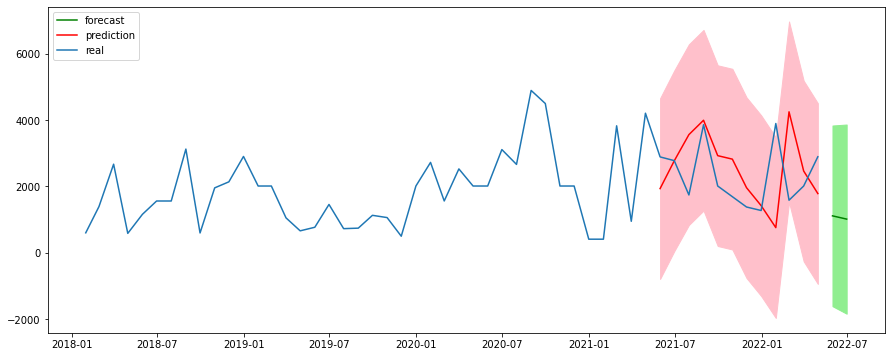

In [ ]:
dates=np.asarray(df.index)
plt.figure(figsize=(15,6))
plt.plot(datas_forecast,forecast_medio.values,color='green',label='forecast')
plt.fill_between(datas_forecast, intervalo_abaixo_f, intervalo_acima_f, color='lightgreen')

plt.plot(datas_previsao,predicao_media.values,color='red',label='prediction')
plt.fill_between(datas_previsao, limites_abaixo, limites_acima, color='pink')

plt.plot(dates,df.values, label='real')
plt.legend(loc='upper left')
plt.show()

Produto 2

In [ ]:
forecast2 = resultado_sarimax2.get_forecast(steps=2)
forecast_medio2 = forecast2.predicted_mean
forecast_medio2.size

2

In [ ]:
intervalo_confianca_forecast2 = forecast2.conf_int()
intervalo_abaixo_f2 = intervalo_confianca_forecast2.iloc[:,0]
intervalo_acima_f2 = intervalo_confianca_forecast2.iloc[:,1]

intervalo_abaixo_f2[0], intervalo_acima_f2[1]

(246.6198985101562, 2906.4409471583963)

In [ ]:
datas_forecast2 = np.asarray(forecast_medio2.index)
pred_dates2=np.asarray(predicao_media2.index)

In [ ]:
forecast_medio2.values

array([1453.59501788, 1511.40739285])

In [ ]:
Valores_reais2 = [1155, 1505]
Valores_reais2

[1155, 1505]

In [ ]:
MAPE = np.mean(np.abs((Valores_reais2 - forecast_medio2.values) / Valores_reais2)) * 100
MAPE

13.13906144433943

MAPE entre Forecast e o Real em maio e junho de 22

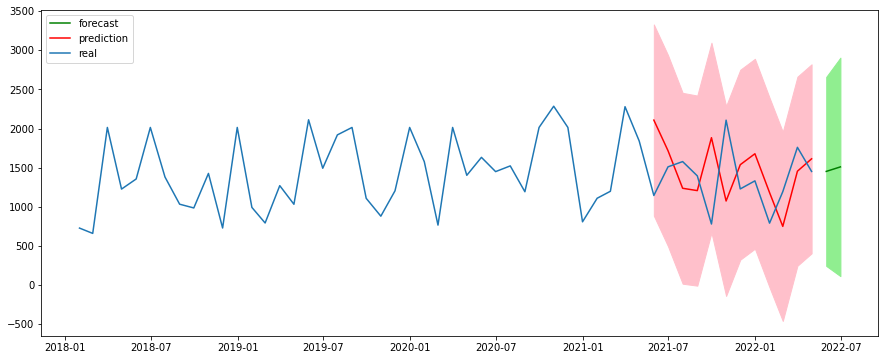

In [ ]:
dates2=np.asarray(df2.index)
plt.figure(figsize=(15,6))
plt.plot(datas_forecast2,forecast_medio2.values,color='green',label='forecast')
plt.fill_between(datas_forecast2, intervalo_abaixo_f2, intervalo_acima_f2, color='lightgreen')

plt.plot(datas_previsao2,predicao_media2.values,color='red',label='prediction')
plt.fill_between(datas_previsao2, limites_abaixo2, limites_acima2, color='pink')

plt.plot(dates2,df2.values, label='real')
plt.legend(loc='upper left')
plt.show()

**Previsão aplicando Auto Time Series**

In [ ]:
exp = TSForecastingExperiment()
exp.setup(df, fh=5, fold=3, session_id=42)

,Description,Value
0,session_id,42
1,Target,Qtde
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(52, 1)"
5,Transformed data shape,"(52, 1)"
6,Transformed train set shape,"(47, 1)"
7,Transformed test set shape,"(5, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


In [ ]:
exp.models()

,Name,Reference,Turbo
ID,,,
naive,Naive Forecaster,sktime.forecasting.naive.NaiveForecaster,True
grand_means,Grand Means Forecaster,sktime.forecasting.naive.NaiveForecaster,True
polytrend,Polynomial Trend Forecaster,sktime.forecasting.trend.PolynomialTrendForeca...,True
arima,ARIMA,sktime.forecasting.arima.ARIMA,True
auto_arima,Auto ARIMA,sktime.forecasting.arima.AutoARIMA,True
exp_smooth,Exponential Smoothing,sktime.forecasting.exp_smoothing.ExponentialSm...,True
croston,Croston,sktime.forecasting.croston.Croston,True
ets,ETS,sktime.forecasting.ets.AutoETS,True
theta,Theta Forecaster,sktime.forecasting.theta.ThetaForecaster,True


In [ ]:
melhores_modelos_3 = exp.compare_models(exclude=['auto_arima'], n_select=3, turbo=False)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.6614,1.3723,1770.3345,1999.1033,1.5759,0.7315,-0.3607,0.3467
croston,Croston,1.6997,1.3923,1811.7275,2026.6229,1.5033,0.7524,-0.3915,0.0300
grand_means,Grand Means Forecaster,1.7230,1.4663,1819.8258,2124.7176,1.1617,0.7727,-0.5541,0.0367
lar_cds_dt,Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0039,2125.6158,1.7239,0.7572,-0.7126,0.0700
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0042,2125.6160,1.7239,0.7572,-0.7126,0.0667
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0039,2125.6158,1.7239,0.7572,-0.7126,0.0733
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0041,2125.6159,1.7239,0.7572,-0.7126,0.0667
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0039,2125.6158,1.7239,0.7572,-0.7126,0.0767
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.7286,1.4390,1863.0039,2125.6158,1.7239,0.7572,-0.7126,0.0667
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.7300,1.4398,1864.3107,2126.5925,1.7243,0.7576,-0.7123,0.0700


Processing:   0%|          | 0/127 [00:00<?, ?it/s]

In [ ]:
melhores_modelos_3

[Croston(), NaiveForecaster(strategy='mean')]

**Avaliando os modelos separadamente**

Modelo NaiveForecaster

In [ ]:
modelo = exp.create_model('naive')
modelo

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.6791,0.8406,940.8333,1247.9559,0.5412,0.7497,-0.9484
1,2019-04,0.6404,0.7003,646.2500,911.9369,0.6454,0.6223,-0.3812
2,2020-04,3.2666,3.0427,3002.5833,3733.7690,0.8156,1.4709,-1.8304
Mean,NaT,1.5287,1.5279,1529.8889,1964.5539,0.6674,0.9476,-1.0533
SD,NaT,1.2290,1.0727,1048.2737,1258.5226,0.1131,0.3737,0.5963


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NaiveForecaster()

Modelo Croston

In [ ]:
modelo1 = exp.create_model('croston')
modelo1

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.6048,0.7275,837.8827,1079.9744,0.6027,0.6459,-0.4591
1,2019-04,0.6309,0.5973,636.6732,777.8112,1.0941,0.5846,-0.0048
2,2020-04,2.6712,2.4348,2455.3157,2987.7493,1.0548,1.0246,-0.8123
Mean,NaT,1.3023,1.2532,1309.9572,1615.1783,0.9172,0.7517,-0.4254
SD,NaT,0.9680,0.8372,814.0458,978.3622,0.2230,0.1946,0.3305


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Croston()

Modelo grand_means

In [ ]:
modelo2 = exp.create_model('grand_means')
modelo2

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.5433,0.6099,752.6667,905.4447,0.8129,0.5647,-0.0256
1,2019-04,0.7056,0.6334,712.0417,824.8584,1.3647,0.6258,-0.1300
2,2020-04,2.6361,2.3828,2423.0952,2923.9168,1.1128,1.0089,-0.7357
Mean,NaT,1.2950,1.2087,1295.9345,1551.4066,1.0968,0.7331,-0.2971
SD,NaT,0.9506,0.8302,797.1955,971.0687,0.2256,0.1966,0.3130


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

NaiveForecaster(strategy='mean')

**Definindo as variáveis de treino e de teste (ou validação)**

In [ ]:
y_treino = exp.get_config("y_train")
y_teste = exp.get_config("y_test")

**Gerando as previsões**

Gerando as previsões do modelo NaiveForecaster

In [ ]:
y_predito = exp.predict_model(modelo)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,Naive Forecaster,1.5172,1.2435,1948.3333,2216.9891,2.1118,0.6684,-1.5261


Plotando as previsões, a série de validação e os dados de treino.

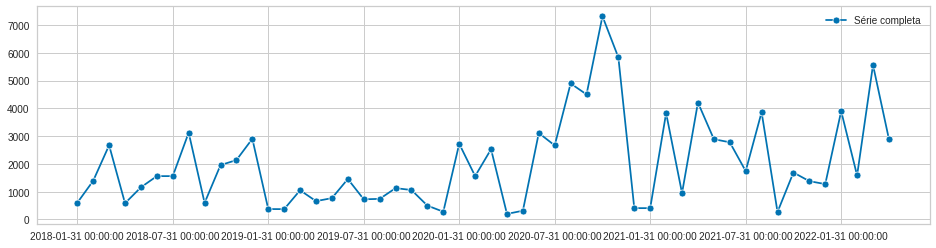

In [ ]:
plot_series(df['Qtde'], labels=['Série completa']);

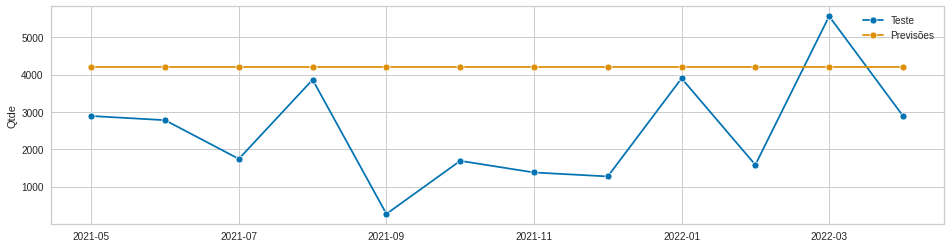

In [ ]:
plot_series(y_teste, y_predito, labels=['Teste', 'Previsões']);

Gerando as previsões do modelo Croston

In [ ]:
y_predito1 = exp.predict_model(modelo1)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,Croston,0.9047,0.7847,1161.8333,1399.0730,1.1375,0.5020,-0.0060


Plotando as previsões, a série de validação e os dados de treino.

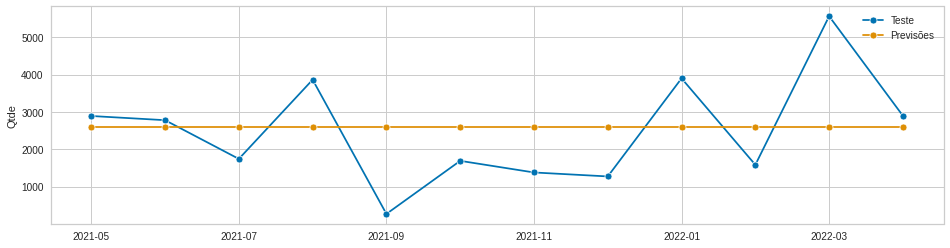

In [ ]:
plot_series(y_teste, y_predito1, labels=['Teste', 'Previsões']);

Gerando as previsões do modelo Grand_means

In [ ]:
y_predito2 = exp.predict_model(modelo2)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,Grand Means Forecaster,0.9047,0.8550,1161.8333,1524.3674,0.8204,0.5130,-0.1942


Plotando as previsões, a série de validação e os dados de treino.

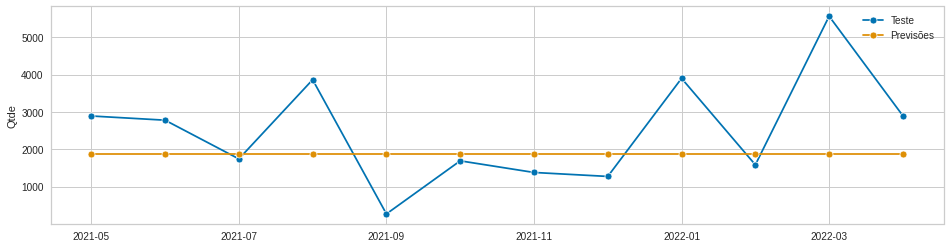

In [ ]:
plot_series(y_teste, y_predito2, labels=['Teste', 'Previsões']);

**Realizando o Tunning do modelo**

*Tunning NaiveForecaster*

Sem mudanças para esse modelo

In [ ]:
modelo_tunado = exp.tune_model(modelo)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.6791,0.8406,940.8333,1247.9559,0.5412,0.7497,-0.9484
1,2019-04,0.6404,0.7003,646.2500,911.9369,0.6454,0.6223,-0.3812
2,2020-04,3.2666,3.0427,3002.5833,3733.7690,0.8156,1.4709,-1.8304
Mean,NaT,1.5287,1.5279,1529.8889,1964.5539,0.6674,0.9476,-1.0533
SD,NaT,1.2290,1.0727,1048.2737,1258.5226,0.1131,0.3737,0.5963


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.7s finished


*Tunning Croston*

Tivemos uma pequena redução nos valores dos erros

In [ ]:
modelo_tunado1 = exp.tune_model(modelo1)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.5457,0.6388,755.9439,948.3660,0.7084,0.5706,-0.1252
1,2019-04,0.5982,0.6013,603.7500,783.0020,0.9223,0.5643,-0.0182
2,2020-04,2.6486,2.4011,2434.5651,2946.4350,1.0922,1.0146,-0.7625
Mean,NaT,1.2642,1.2137,1264.7530,1559.2677,0.9076,0.7165,-0.3020
SD,NaT,0.9792,0.8397,829.5123,983.1959,0.1570,0.2108,0.3286


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    0.7s finished


In [ ]:
print(modelo1)
print(modelo_tunado1)

Croston()
Croston(smoothing=0.2910635913133069)


In [ ]:
y_predito_tunado1 = exp.predict_model(modelo_tunado1)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,Croston,0.9312,0.8199,1195.8224,1461.8907,1.2942,0.5046,-0.0984


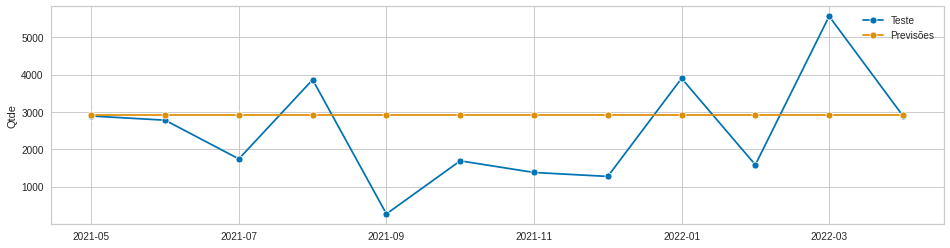

In [ ]:
plot_series(y_teste, y_predito_tunado1, labels=['Teste', 'Previsões']);

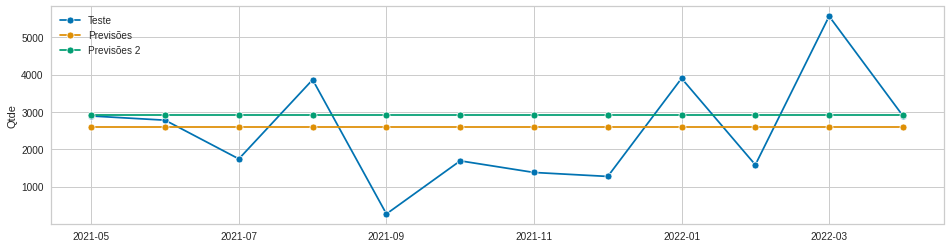

In [ ]:
plot_series(y_teste, y_predito1,y_predito_tunado1, labels=['Teste', 'Previsões','Previsões 2']);

*Tunning grand_means*

Sem mudanças para esse modelo

In [ ]:
modelo_tunado2 = exp.tune_model(modelo2)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.5433,0.6099,752.6667,905.4447,0.8129,0.5647,-0.0256
1,2019-04,0.7056,0.6334,712.0417,824.8584,1.3647,0.6258,-0.1300
2,2020-04,2.6361,2.3828,2423.0952,2923.9168,1.1128,1.0089,-0.7357
Mean,NaT,1.2950,1.2087,1295.9345,1551.4066,1.0968,0.7331,-0.2971
SD,NaT,0.9506,0.8302,797.1955,971.0687,0.2256,0.1966,0.3130


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    4.2s finished


In [ ]:
print(modelo2)
print(modelo_tunado2)

NaiveForecaster(strategy='mean')
NaiveForecaster(strategy='mean')


**Combinando modelos**

Conforme abaixo, serão combinados o primeiro melhor modelo e o segundo melhor (NaveForecaster e Croston).

In [ ]:
modelo_blend = exp.blend_models(melhores_modelos_3[0:2])

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2018-04,0.5527,0.6529,765.6373,969.3176,0.6807,0.5793,-0.1755
1,2019-04,0.6682,0.6095,674.3574,793.6687,1.2294,0.6070,-0.0462
2,2020-04,2.6537,2.4086,2439.2055,2955.6102,1.0838,1.0168,-0.7735
Mean,NaT,1.2915,1.2237,1293.0668,1572.8655,0.9980,0.7344,-0.3317
SD,NaT,0.9643,0.8380,811.2988,980.3742,0.2321,0.2001,0.3168


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

Mesmo com a combinação, o melhor modelo é a tunagem do modelo Croston

In [ ]:
y_predito_blend = exp.predict_model(modelo_blend)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,EnsembleForecaster,0.9047,0.7952,1161.8333,1417.7237,0.9790,0.5097,-0.0330


**Finalizando o modelo**

Utilizaremos o melhor modelo que foi o Tunning do Croston

In [ ]:
modelo_final = exp.finalize_model(modelo_tunado1)
previsoes = exp.predict_model(modelo_final, verbose=False)

In [ ]:
previsoes

,y_pred
2022-05,3047.3516
2022-06,3047.3516
2022-07,3047.3516
2022-08,3047.3516
2022-09,3047.3516
2022-10,3047.3516
2022-11,3047.3516
2022-12,3047.3516
2023-01,3047.3516
2023-02,3047.3516


<AxesSubplot:>

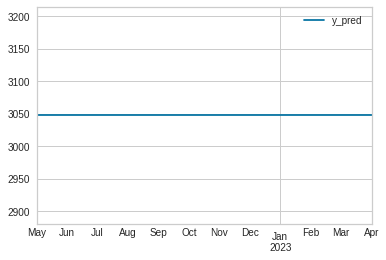

In [ ]:
previsoes.plot(kind='line')